# Proyecto Final - Rewilding: Automatización del Proceso de Clasificación de Imágenes.

*Problema:* los procesos de estimacion de abundancia de especies que utiliza Rewilding actualmente no son eficientes y eficaces. Por lo que los resultados son mejorables.

*Solucion:* automatizar procesos con AI :) 

In [1]:
# Se importan las librerias necesarias.
# Módulos estándar de Python
import collections
import gc
import io
import json
import os
import pickle
import random
import re
from collections import Counter
from datetime import datetime as dt
from io import BytesIO

# Bibliotecas de terceros
import boto3
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image, ImageDraw
from PIL.ExifTags import TAGS
from IPython.display import display
from tabulate import tabulate
from unidecode import unidecode

# Importaciones locales
from funciones import definirRuta, extraerFechaHora

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


2023-11-11 18:07:28.203724: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2, in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Base de Datos:

Se obtuvo la base de datos de los últimos proyectos de captura de imágenes con cámaras trampa. La base está segmentada según la zona, el año y la cámara.

### S3

La base esta almacenada en AWS en un bucket de S3. Se puede acceder con los accessKey de cada usuario habilitado.

In [42]:
# Importo Informacion del AccessKey.
accessKey = os.getenv("AccessKey")
secretKey = os.getenv("SecretKey")

In [43]:
# Configura tus credenciales de AWS si aún no lo has hecho
boto3.setup_default_session(aws_access_key_id=accessKey,
                           aws_secret_access_key=secretKey,
                           region_name='us-east-2')

In [44]:
# Nombre del bucket
nombre_bucket_s3 = 's3-pfa'

In [45]:
# Crea un cliente de S3
s3 = boto3.client('s3')

### Dimensiones de la Base

In [31]:
# Leer objetos_s3
with open('ArchivosUtiles/objetos_s3.pkl', 'rb') as archivo:
    objetos_s3 = pickle.load(archivo)

In [32]:
# Cantidad de Imagenes: 
len(objetos_s3) 

165085

### Overview de las Imagenes

In [25]:
# Veo imagenes random de sauce 2022.
sauce_2022 = [ruta for ruta in objetos_s3 if ruta.startswith("Muestreo ct sauce/CT S 2022")]
random.shuffle(sauce_2022)
minidf = sauce_2022[:16]

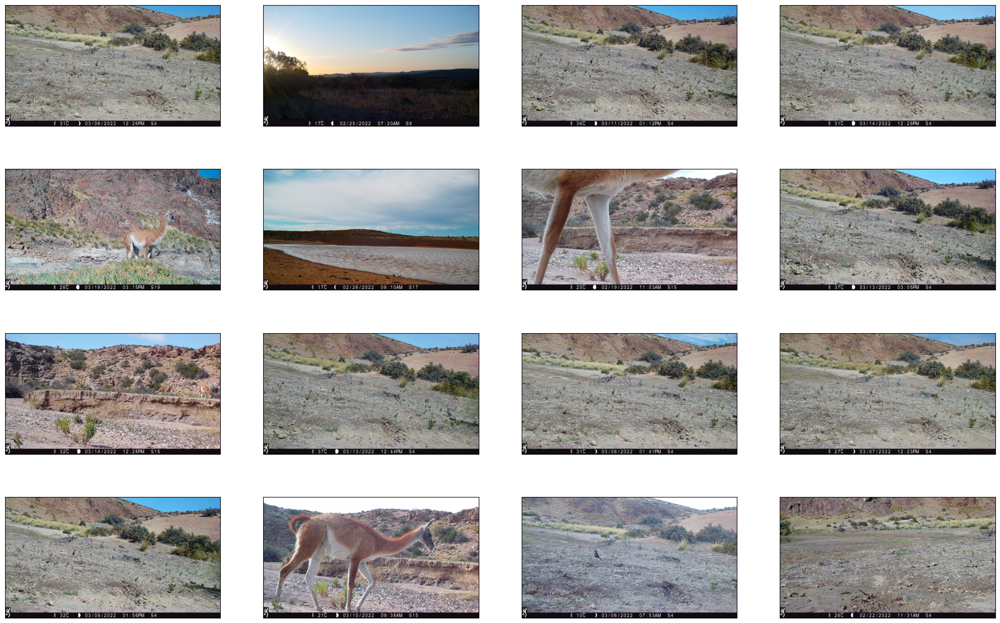

In [26]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)


#### Distribucion de informacion en carpetas:

In [10]:
paths_filtrados = []

for path in objetos_s3:
    # Buscar "Muestreo ct Iberica" o "Muestreo ct sauce" en el path
    if "Muestreo ct Iberica" in path or "Muestreo ct sauce" in path:
        # Buscar el año en el path
        paths_filtrados.append(path)

In [11]:
# Divide las rutas en componentes (directorios, archivo)
componentes = [ruta.split('/') for ruta in paths_filtrados]
# Crea un DataFrame con las columnas adecuadas
df = pd.DataFrame(componentes , columns=['Sitio', 'Año', 'Camara', 'Archivo', 'Archivo2'])


In [12]:
# Utiliza groupby para agrupar por sitio, año y cámara, y luego cuenta los archivos en cada grupo
tabla_conteo = df.groupby(['Sitio', 'Año', 'Camara']).size().reset_index(name='Cantidad')


In [13]:
tabla_conteo.to_csv('tabla.csv', index=False)

### Dataframe

In [ ]:
# Ruta del dataframe.
ruta_archivo_s3 = 'Muestreo_CT_PatAzul_2020-2023.xlsx'
# Descarga el archivo desde S3
response = s3.get_object(Bucket=nombre_bucket_s3, Key=ruta_archivo_s3)

In [ ]:
# Lee el contenido del archivo Excel en un DataFrame de Pandas
excel_data = response['Body'].read()
df = pd.read_excel(BytesIO(excel_data), engine='openpyxl')

In [ ]:
# Elimino las columnas vacias 
df = df.iloc[:,:8]

In [ ]:
# Preview de la base
df

,Sitio,Año,Cámara,Especie,Cantidad,Nombre,Fecha,Hora
0,Sauce,2020,S1,Guanaco,1.0,0-S1- (3).JPG,2020-02-05,20:46:22
1,Sauce,2020,S1,Guanaco,1.0,0-S1- (4).JPG,2020-02-05,20:47:10
2,Sauce,2020,S1,Guanaco,1.0,0-S1- (5).JPG,2020-02-05,20:47:12
3,Sauce,2020,S1,Guanaco,1.0,0-S1- (6).JPG,2020-02-05,20:47:16
4,Sauce,2020,S1,Guanaco,4.0,0-S1- (7).JPG,2020-02-05,20:51:48
...,...,...,...,...,...,...,...,...
2643,Ibérica,2022,IB7,Choique,1.0,IB 22 (6).JPG,2022-05-05,17:57:50
2644,Ibérica,2022,IB7,Choique,1.0,IB 22 (11).JPG,2022-05-13,8:30:26
2645,Ibérica,2022,IB7,Choique,1.0,IB 22 (15).JPG,2022-05-13,8:30:34
2646,Ibérica,2022,IB7,Guanaco,1.0,IB 22 (22).JPG,2022-05-14,8:35:10


In [31]:
# Informacion de la base
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2648 entries, 0 to 2647
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Sitio     2648 non-null   object        
 1   Año       2648 non-null   int64         
 2   Cámara    2648 non-null   object        
 3   Especie   2648 non-null   object        
 4   Cantidad  2644 non-null   float64       
 5   Nombre    2648 non-null   object        
 6   Fecha     2648 non-null   datetime64[ns]
 7   Hora      2648 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(5)
memory usage: 165.6+ KB


- No hay nulos
- Hay 2648 datos

In [32]:
# Cantidad de registros etiquetados.
len(df)

2648

In [33]:
paths_filtrados = []

for path in objetos_s3:
    # Buscar "Muestreo ct Iberica" o "Muestreo ct sauce" en el path
    if "Muestreo ct Iberica" in path or "Muestreo ct sauce" in path:
        # Buscar el año en el path
        year_start = path.find("20")
        if year_start != -1:
            # Intentar extraer el año en formato "20XX"
            try:
                año = int(path[year_start:year_start+4])
                if año < 2023:
                    paths_filtrados.append((path, año))
            except ValueError:
                # Si no se puede convertir a int, intentar encontrar un año en el formato "CT S 2020"
                match = re.search(r'\b(20\d{2})\b', path)
                if match:
                    año = int(match.group(0))
                    if año < 2023:
                        paths_filtrados.append((path, año))

In [34]:
# Cantidad de imagenes (para años anteriores a 2023) # 2,351 + 39,869
len(paths_filtrados)

42220

In [6]:
# Definir la paleta de colores
colores = [ '#2B3B52', '#355028', '#25401B', '#907766', '#FDFBF8', '#B3CA9B']

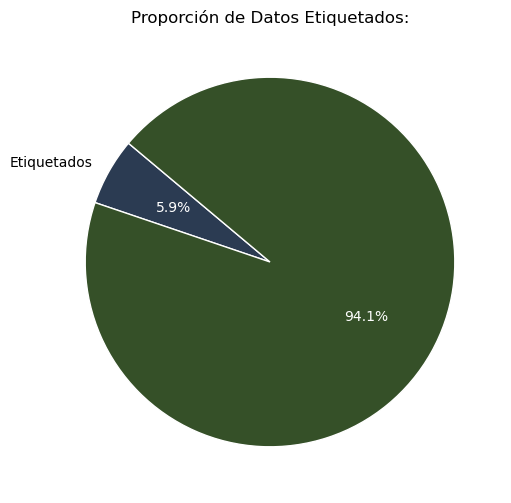

In [36]:
# Crear un gráfico de torta
fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    (len(df), len(paths_filtrados)),
    labels=('Etiquetados', ''),
    autopct='%1.1f%%',
    startangle=140,
    colors=colores,
    wedgeprops={'edgecolor': 'white'}  
)

for text in autotexts:
    text.set_color('white')

plt.title('Proporción de Datos Etiquetados:')
plt.show()

In [37]:
# Cantidad de datos para cada Sitio
df['Sitio'].value_counts()

Sitio
Sauce      2300
Ibérica     348
Name: count, dtype: int64

In [38]:
# Imprimo las especies presentadas.
print(df['Especie'].unique())
print(len(df['Especie'].unique()))

['Guanaco' 'Zorro Gris' 'Martineta' 'Choique' 'Gato montés' 'passeriforme'
 'Liebre' 'peludo' 'Mara' 'Tucuquere' 'Passeriforme' 'Gaviota' 'Jote'
 'Peludo' 'Piche' 'Chimango' 'Ave S/I' 'Flamenco' 'Aguila Mora' 'Zorrino'
 'Puma' 'Pato' 'Garza Blanca' 'Halcon' 'atahacaminos' 'Bandurrita'
 'Chingolo' 'Ratón' 'Loica' 'Calandria ' 'Zorzal chiguanco'
 'Zorzal Chiguanco' 'Oveja' 'Yal negro' 'Zorrino ' 'Torcaza'
 'Zorro Colorado' 'Carancho' 'Bandurria' 'Aguilucho Comun'
 'Cormoran Imperial' 'Cauquen']
42


#### Normalizacion de Texto

In [39]:
# Eliminar los espacios enfrente y atras de las variables.
df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

In [40]:
# Le saco las tildes a la base:
df.rename(columns={'Cámara': 'Camara'}, inplace=True)
df = df.applymap(lambda x: unidecode(x) if isinstance(x, str) else x)

In [41]:
# Lo convierto a minusculas
df['Especie'] = df['Especie'].str.lower()

In [42]:
# Le saco los espacios dobles.
df = df.applymap(lambda x: x.replace('  ',' ') if isinstance(x, str) else x)

#### Normalizacion de Tipos de Dato:

In [43]:
df['Hora'] = pd.to_datetime(df['Hora'], format="%H:%M:%S").dt.strftime("%H:%M")

#### Normalizar Especies

In [44]:
df.loc[df['Especie']=='bandurrita', 'Especie'] = 'bandurria'

In [45]:
# Imprimo las especies presentadas.
print(df['Especie'].unique())
print(len(df['Especie'].unique()))

['guanaco' 'zorro gris' 'martineta' 'choique' 'gato montes' 'passeriforme'
 'liebre' 'peludo' 'mara' 'tucuquere' 'gaviota' 'jote' 'piche' 'chimango'
 'ave s/i' 'flamenco' 'aguila mora' 'zorrino' 'puma' 'pato' 'garza blanca'
 'halcon' 'atahacaminos' 'bandurria' 'chingolo' 'raton' 'loica'
 'calandria' 'zorzal chiguanco' 'oveja' 'yal negro' 'torcaza'
 'zorro colorado' 'carancho' 'aguilucho comun' 'cormoran imperial'
 'cauquen']
37


#### Normalizar Ruta Archivo

El dataframe no tiene la informacion exacta de la ruta por lo que se crea esta funcion que lo normaliza.

In [46]:
def defRuta(fila):
    ruta = 'Muestreo ct '
    if fila['Sitio'] == 'Sauce':
        ruta += 'sauce/CT S ' + str(fila['Año']) + '/' + str(fila['Camara']) + '/' + fila['Nombre']
    elif fila['Sitio'] == "Iberica":
        ruta += "Iberica/" + str(fila['Año']) + '/' + fila['Camara'] + '/' + fila['Nombre']
    else:
        raise ValueError("No existe esa ruta.")
    if ruta in objetos_s3:
        return ruta
    return ''

In [47]:
df['Ruta'] = df.apply(defRuta, axis=1)

In [48]:
df['esta'] = df['Ruta'].apply(lambda x: False if x =='' else True)

In [49]:
df['esta'].value_counts()

esta
True     1719
False     929
Name: count, dtype: int64

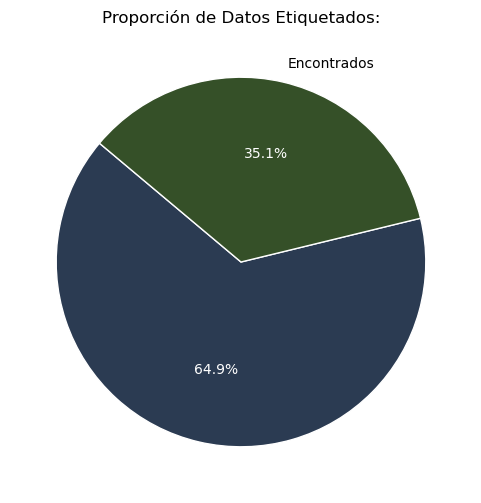

In [50]:
# Crear un gráfico de torta
fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    df['esta'].value_counts(),
    labels=("","Encontrados"),
    autopct='%1.1f%%',
    startangle=140,
    colors=colores,
    wedgeprops={'edgecolor': 'white'}  
)

for text in autotexts:
    text.set_color('white')

plt.title('Proporción de Datos Etiquetados:')
plt.show()

La ruta no solo depende del sitio, ademas depende del año, la camara, el nombre... Se necesita una funcion de definirRuta mucho mas explicita.

In [51]:
df['Ruta'] = df.apply(definirRuta, axis=1)

In [52]:
df['esta'] = df['Ruta'].apply(lambda x: False if x == '' else True)

In [53]:
df['esta'].value_counts()

esta
True     2252
False     396
Name: count, dtype: int64

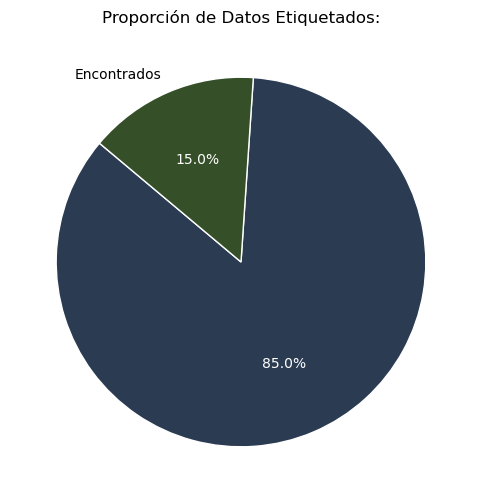

In [54]:
# Crear un gráfico de torta
fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    df['esta'].value_counts(),
    labels=("","Encontrados"),
    autopct='%1.1f%%',
    startangle=140,
    colors=colores,
    wedgeprops={'edgecolor': 'white'}  
)

for text in autotexts:
    text.set_color('white')

plt.title('Proporción de Datos Etiquetados:')
plt.show()

Las imagenes a las que se les encontro la ruta en la base se las sometio a un segundo checkeo. Esto se realizo utilizando las funciones extraerFecha() y extraerHora() que extraen los datos Fecha y Hora de la imagen.

In [11]:
# Cargar el DataFrame desde el archivo pickle
df = pd.read_pickle('ArchivosUtiles/df.pkl')

In [12]:
df['Ruta'] = df.apply(definirRuta, axis=1)

In [13]:
df['esta'] = df['Ruta'].apply(lambda x: False if x == '' else True)

In [14]:
df['esta'].value_counts()

esta
True     2628
False      17
Name: count, dtype: int64

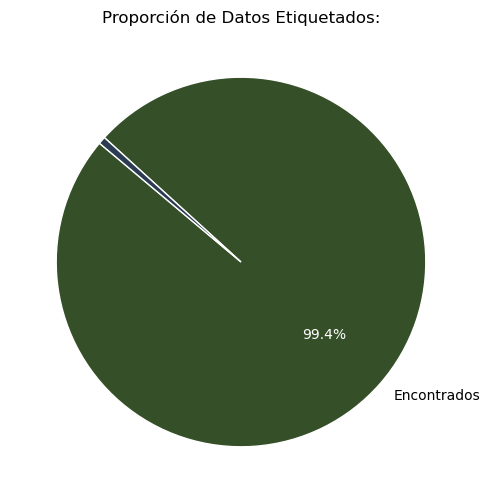

In [24]:
# Crear un gráfico de torta
fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    df['esta'].value_counts(),
    labels=("Encontrados",''),
    autopct=lambda pct: "{:.1f}%".format(pct) if pct > 1 else '',
    startangle=140,
    colors=(colores[1],colores[0]),
    wedgeprops={'edgecolor': 'white'}
)

for text in autotexts:
    text.set_color('white')

plt.title('Proporción de Datos Etiquetados:')
plt.show()

In [15]:
noExiste = df[df['esta']==False]

In [16]:
pd.crosstab([noExiste['Sitio'],noExiste['Año'],noExiste['Camara']],noExiste['Rota'])

Rota                 False
Sitio   Año  Camara       
Iberica 2022 IB1         1
Sauce   2020 S17         4
        2021 S13         1
             S15         2
             S17         1
             S2          2
             S7          1
        2022 S8          5

#### Rutas Duplicadas

In [19]:
a = df[df.duplicated(subset=('Sitio', 'Año', 'Camara', 'Nombre','Especie'), keep=False)]
a[a['Ruta'] != '']

,Sitio,Año,Camara,Especie,Cantidad,Nombre,Fecha,Hora,Ruta,existe,Rota,esta


In [16]:
df.loc[df['Ruta']=='Muestreo ct sauce/CT S 2020/S17/z-S17 (2792).JPG','Cantidad'] = 5
df.loc[df['Ruta']=='Muestreo ct sauce/CT S 2022/S1/1/1-S1- (10).JPG','Cantidad'] = 4
df.loc[df['Ruta']=='Muestreo ct sauce/CT S 2022/S15/1/IMG_0383.JPG','Cantidad'] = 2
df.loc[df['Ruta']=='Muestreo ct sauce/CT S 2022/S15/IMG_0335.JPG','Cantidad'] = 5
df.loc[df['Ruta']=='Muestreo ct sauce/CT S 2022/S15/IMG_0336.JPG','Cantidad'] = 6
df.loc[df['Ruta']=='Muestreo ct sauce/CT S 2022/S3/2/IMG_0226.JPG','Cantidad'] = 2
df.loc[df['Ruta']=='Muestreo ct sauce/CT S 2022/S5/1/2 - S5 - (11).JPG','Cantidad'] = 4

In [18]:
df = df.drop_duplicates(subset=['Sitio', 'Año', 'Camara', 'Nombre','Especie'], keep='first')

In [20]:
#  df.to_csv('ArchivosUtiles/df_normalizado.csv')

### Analisis Exploratorio:

In [70]:
df.shape

(2637, 12)

In [74]:
df.loc[:,'Año'] = df.loc[:,'Año'].astype(int)
df.loc[:,'Cantidad'] = df.loc[:,'Cantidad'].astype(int)

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2637 entries, 0 to 2647
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Sitio     2637 non-null   object
 1   Año       2637 non-null   int64 
 2   Camara    2637 non-null   object
 3   Especie   2637 non-null   object
 4   Cantidad  2637 non-null   int64 
 5   Nombre    2637 non-null   object
 6   Fecha     2637 non-null   object
 7   Hora      2637 non-null   object
 8   Ruta      2637 non-null   object
 9   existe    2637 non-null   bool  
 10  Rota      2637 non-null   bool  
 11  esta      2637 non-null   bool  
dtypes: bool(3), int64(2), object(7)
memory usage: 213.7+ KB


In [19]:
data = df.iloc[:,:8]

#### Sitio

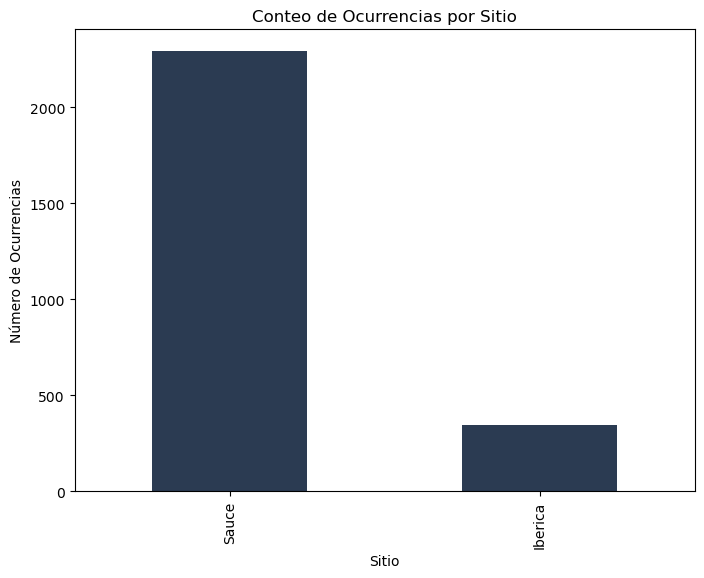

In [77]:
conteo_sitio = data['Sitio'].value_counts()
conteo_sitio.plot(kind='bar', figsize=(8, 6), color=colores[0])
plt.title('Conteo de Ocurrencias por Sitio')
plt.xlabel('Sitio')
plt.ylabel('Número de Ocurrencias')
plt.show()

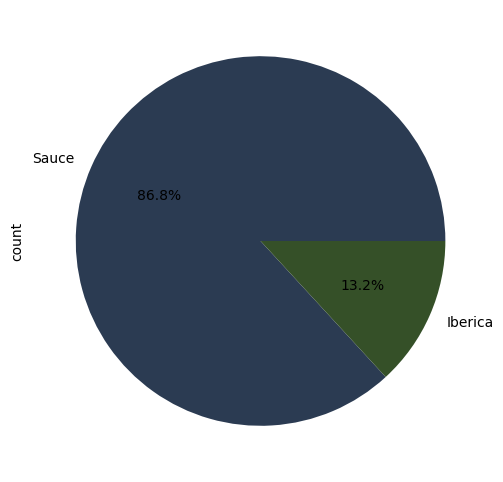

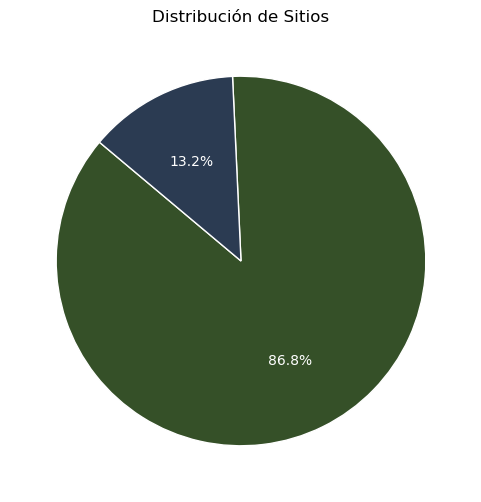

In [78]:
conteo_sitio.plot(kind='pie', autopct='%1.1f%%', figsize=(6, 6), colors=colores)

fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    conteo_sitio,
    autopct='%1.1f%%',
    startangle=140,
    colors=(colores[1],colores[0]),
    wedgeprops={'edgecolor': 'white'}
)

for text in autotexts:
    text.set_color('white')
plt.title('Distribución de Sitios')
plt.ylabel('')
plt.show()

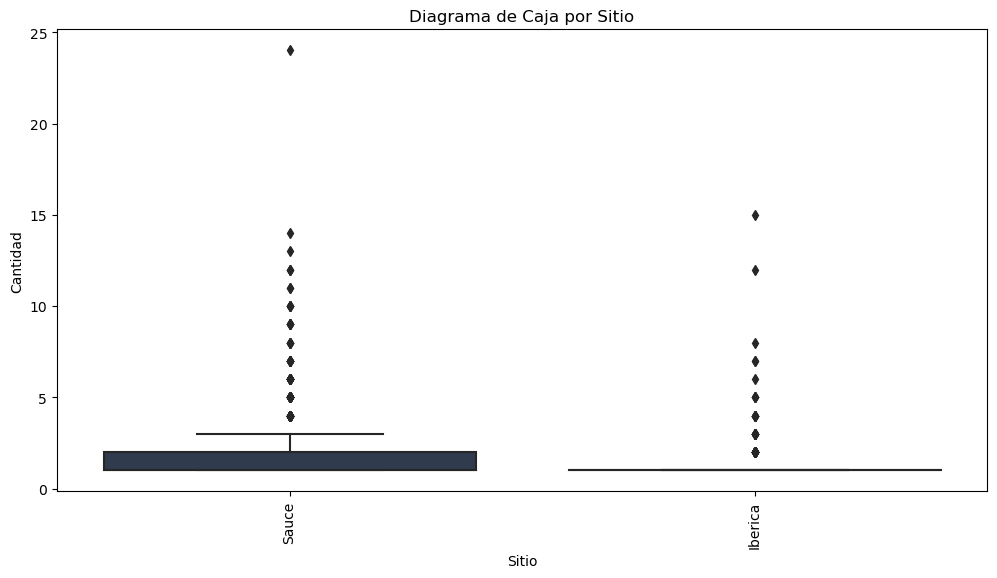

In [79]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Sitio', y='Cantidad', data=data, color = colores[0])
plt.title('Diagrama de Caja por Sitio')
plt.xlabel('Sitio')
plt.ylabel('Cantidad')
plt.xticks(rotation=90)
plt.show()

#### Año

/var/folders/6c/17qbm4nd5318hd4bcrx68wjh0000gn/T/ipykernel_87939/3987337984.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.lineplot(data=data_sum, x='Año', y='Cantidad', hue='Sitio', ci=None, palette=colores, linewidth=3)
/var/folders/6c/17qbm4nd5318hd4bcrx68wjh0000gn/T/ipykernel_87939/3987337984.py:6: UserWarning: The palette list has more values (5) than needed (2), which may not be intended.
  ax = sns.lineplot(data=data_sum, x='Año', y='Cantidad', hue='Sitio', ci=None, palette=colores, linewidth=3)


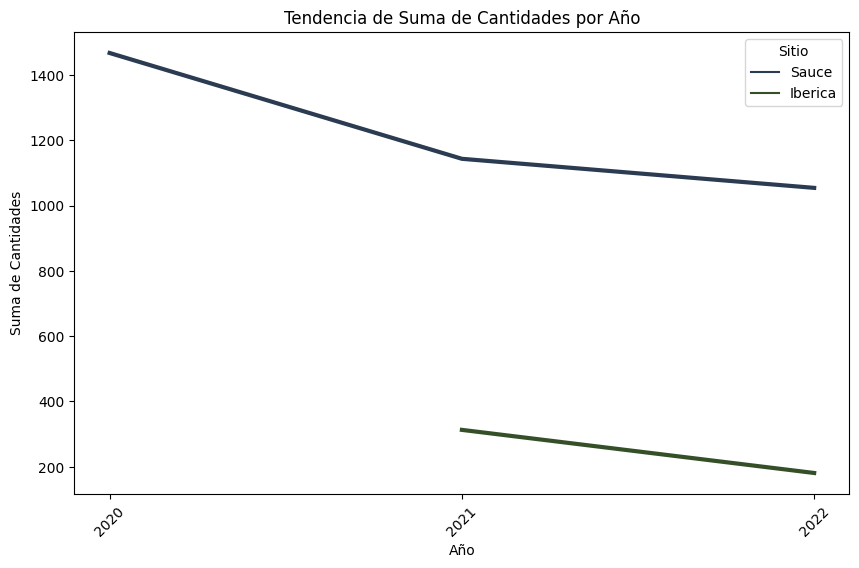

In [ ]:
# Agrupa y suma las cantidades por año y sitio
data_sum = data.groupby(['Año', 'Sitio'])['Cantidad'].sum().reset_index()

# Crea un gráfico lineal con una línea más gruesa (por ejemplo, linewidth=2)
plt.figure(figsize=(10, 6))
ax = sns.lineplot(data=data_sum, x='Año', y='Cantidad', hue='Sitio', ci=None, palette=colores, linewidth=3)

# Elimina la grilla de fondo
ax.yaxis.grid(False)
ax.xaxis.grid(False)

# Formatea los valores del eje x como años enteros
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))

plt.title('Tendencia de Suma de Cantidades por Año')
plt.xlabel('Año')
plt.ylabel('Suma de Cantidades')
plt.xticks(rotation=45)
plt.show()


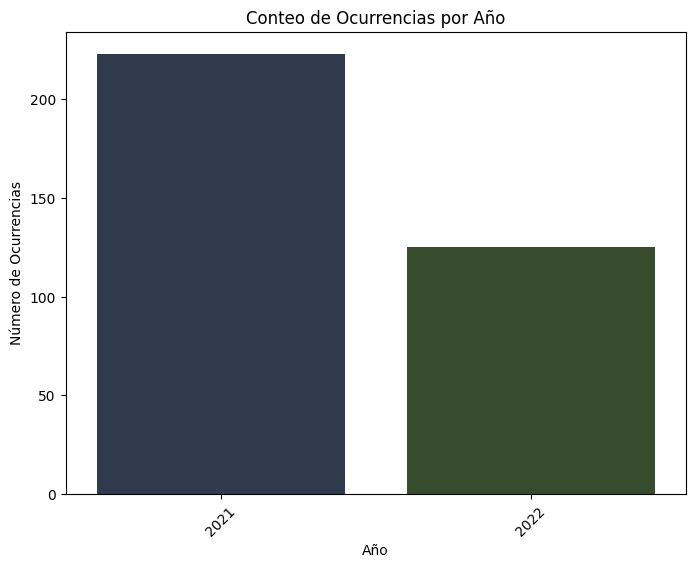

In [ ]:
# Iberica
plt.figure(figsize=(8, 6))
sns.countplot(data=data[data['Sitio']=='Iberica'], x='Año', palette=colores)
plt.title('Conteo de Ocurrencias por Año')
plt.xlabel('Año')
plt.ylabel('Número de Ocurrencias')
plt.xticks(rotation=45)
plt.show()

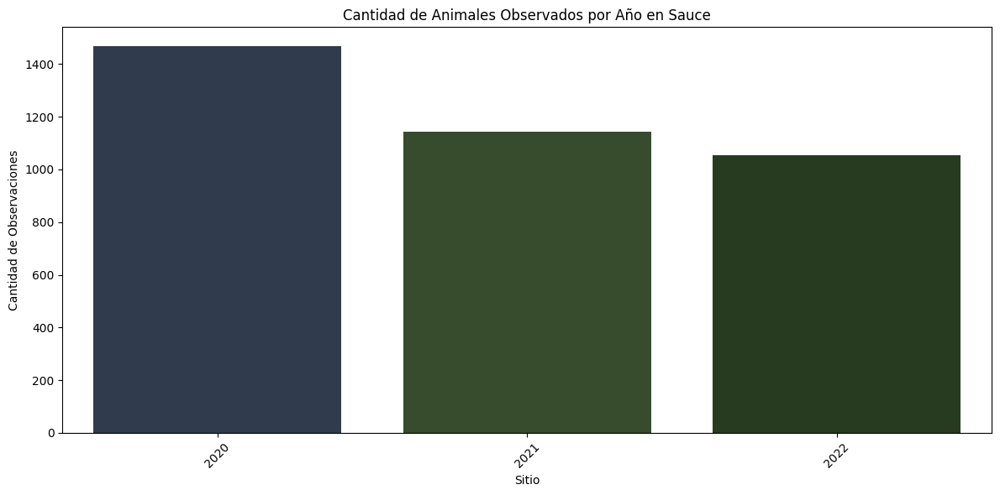

In [ ]:
agrupado = data[data['Sitio']=='Sauce'].groupby('Año')['Cantidad'].sum().reset_index()

# Crea un gráfico de barras agrupado
plt.figure(figsize=(12, 6))
sns.barplot(data=agrupado, x='Año', y='Cantidad', palette=colores)
plt.xlabel('Sitio')
plt.ylabel('Cantidad de Observaciones')
plt.title('Cantidad de Animales Observados por Año en Sauce')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

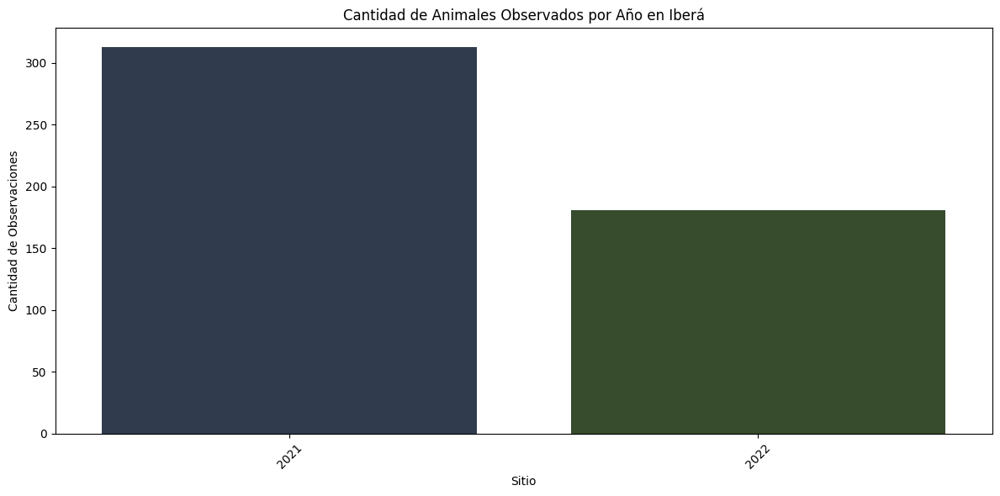

In [ ]:
agrupado = data[data['Sitio']=='Iberica'].groupby('Año')['Cantidad'].sum().reset_index()

# Crea un gráfico de barras agrupado
plt.figure(figsize=(12, 6))
sns.barplot(data=agrupado, x='Año', y='Cantidad', palette=colores)
plt.xlabel('Sitio')
plt.ylabel('Cantidad de Observaciones')
plt.title('Cantidad de Animales Observados por Año en Iberá')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

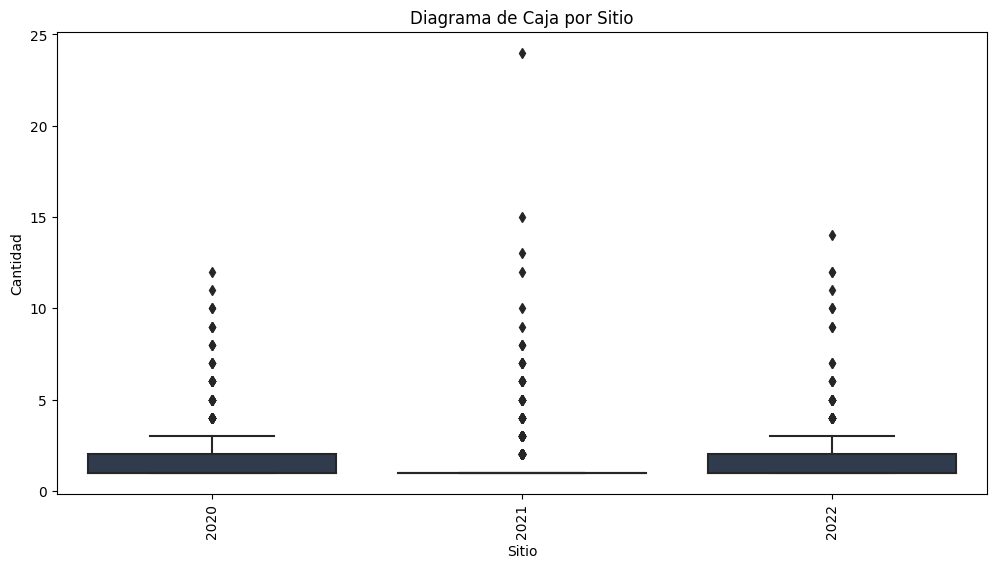

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Año', y='Cantidad', data=data, color = colores[0])
plt.title('Diagrama de Caja por Sitio')
plt.xlabel('Sitio')
plt.ylabel('Cantidad')
plt.xticks(rotation=90)
plt.show()

#### Camara:

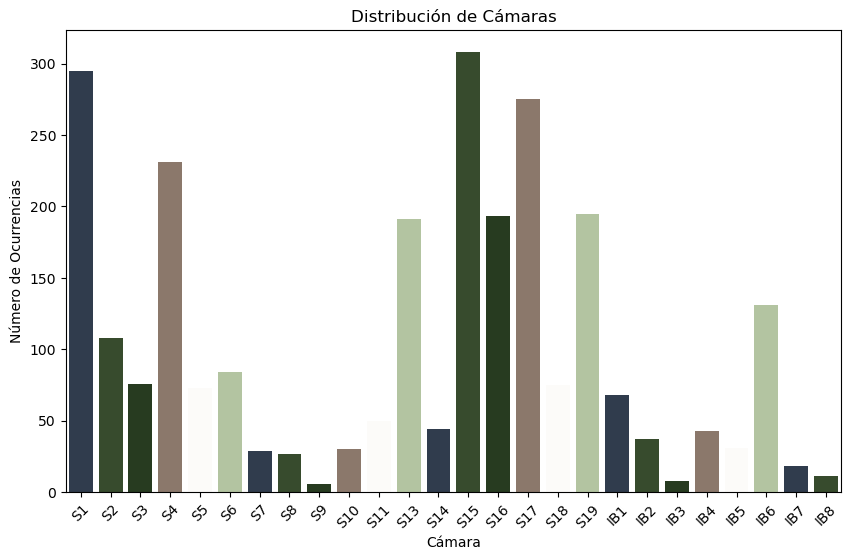

In [20]:
plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='Camara', palette=colores)
plt.title('Distribución de Cámaras')
plt.xlabel('Cámara')
plt.ylabel('Número de Ocurrencias')
plt.xticks(rotation=45)
plt.show()

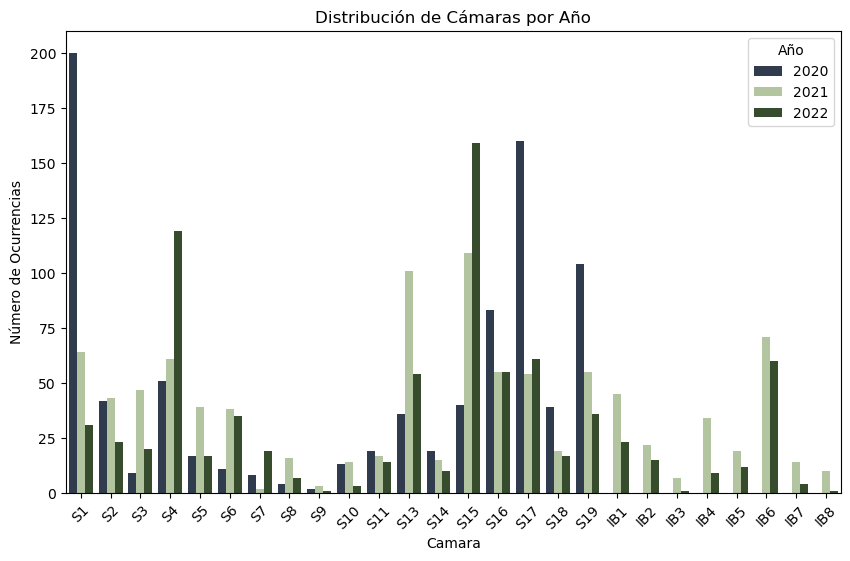

In [25]:
# Sauce
plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='Camara', hue='Año', palette=([colores[0],colores[5],colores[1]]))
plt.title('Distribución de Cámaras por Año')
plt.xlabel('Camara')
plt.ylabel('Número de Ocurrencias')
plt.xticks(rotation=45)
plt.legend(title='Año', loc='upper right')
plt.show()

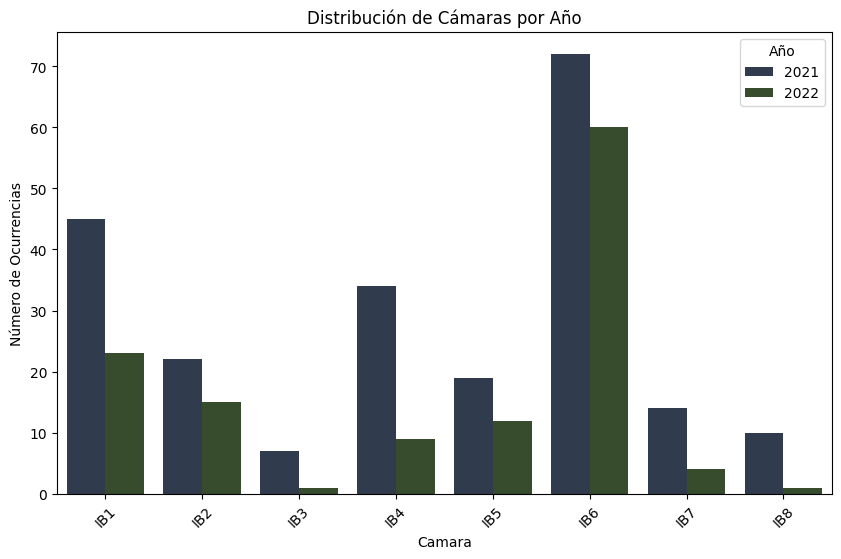

In [ ]:
# Iberica
plt.figure(figsize=(10, 6))
sns.countplot(data=data[data['Sitio']=='Iberica'], x='Camara', hue='Año', palette=colores)
plt.title('Distribución de Cámaras por Año')
plt.xlabel('Camara')
plt.ylabel('Número de Ocurrencias')
plt.xticks(rotation=45)
plt.legend(title='Año', loc='upper right')
plt.show()

#### Nombre:

In [ ]:
data['Nombre'].unique()

array(['0-S1- (3).JPG', '0-S1- (4).JPG', '0-S1- (5).JPG', ...,
       'IB 22 (11).JPG', 'IB 22 (15).JPG', 'IB 22 (22).JPG'], dtype=object)

#### Especie:

In [10]:
# Proporcion de Guanacos
len(data[data['Especie']=='guanaco'])/len(data)

0.688468809073724

In [9]:
data['Especie'].unique()

array(['guanaco', 'zorro gris', 'martineta', 'choique', 'gato montes',
       'passeriforme', 'liebre', 'peludo', 'mara', 'tucuquere', 'gaviota',
       'jote', 'piche', 'chimango', 'ave s/i', 'flamenco', 'aguila mora',
       'zorrino', 'puma', 'pato', 'garza blanca', 'halcon',
       'atahacaminos', 'bandurria', 'chingolo', 'raton', 'loica',
       'calandria', 'zorzal chiguanco', 'oveja', 'yal negro', 'torcaza',
       'zorro colorado', 'carancho', 'aguilucho comun',
       'cormoran imperial', 'cauquen'], dtype=object)

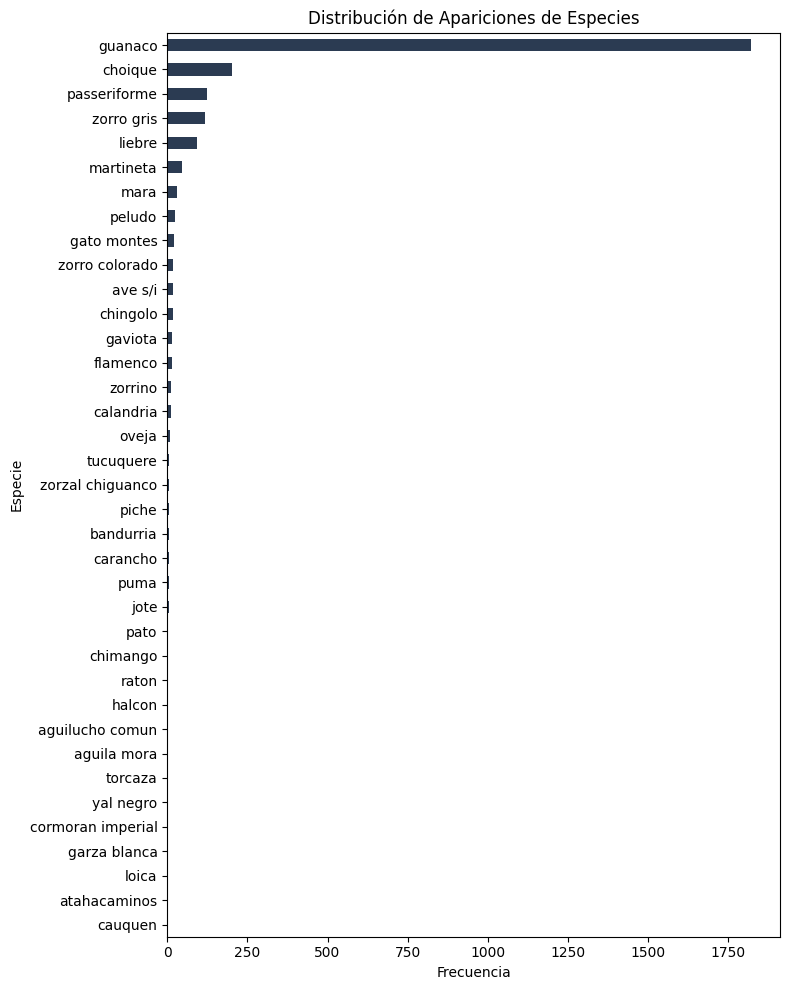

In [ ]:
# Cuenta la frecuencia de cada especie y ordena de mayor a menor
especies_frecuencia = data['Especie'].value_counts().sort_values(ascending=True)

# Crea un gráfico de barras horizontal
plt.figure(figsize=(8, 10))  # Ajusta el tamaño si es necesario
especies_frecuencia.plot(kind='barh', color = colores[0])  # Usa 'barh' para gráfico de barras horizontal
plt.xlabel('Frecuencia')
plt.ylabel('Especie')
plt.title('Distribución de Apariciones de Especies')
plt.tight_layout()
plt.show()

In [120]:
def guanaco(fila):
    if fila == 'guanaco':
        return True
    else:
        return False

data['Guanaco'] = data['Especie'].apply(guanaco)

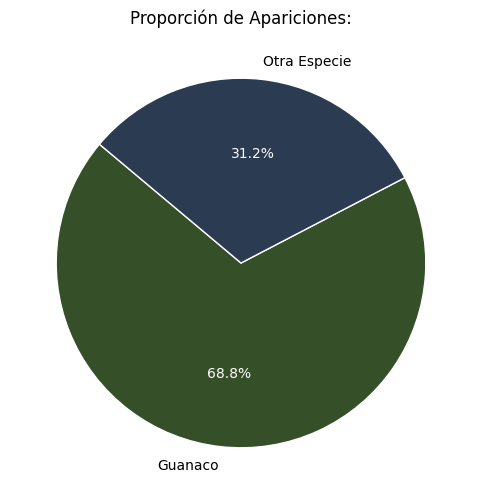

In [122]:
fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    data['Guanaco'].value_counts(),
    labels=("Guanaco",'Otra Especie'),
    autopct='%1.1f%%',
    startangle=140,
    colors=(colores[1],colores[0]),
    wedgeprops={'edgecolor': 'white'}  
)

for text in autotexts:
    text.set_color('white')

plt.title('Proporción de Apariciones:')
plt.show()

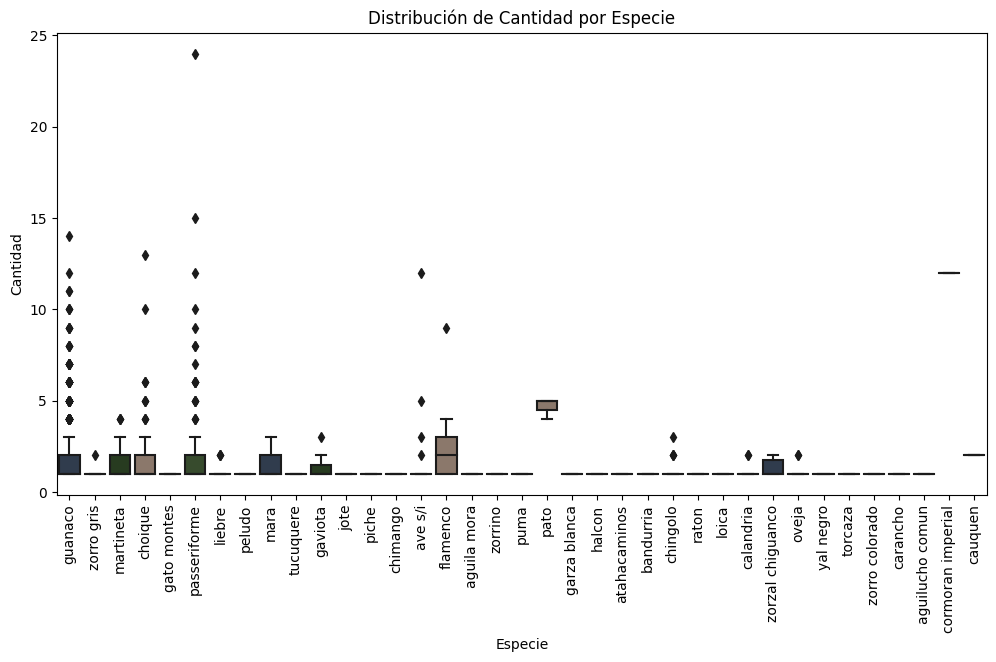

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Especie', y='Cantidad', palette=colores)
plt.title('Distribución de Cantidad por Especie')
plt.xlabel('Especie')
plt.ylabel('Cantidad')
plt.xticks(rotation=90)
plt.show()

#### Cantidad:

In [ ]:
data['Cantidad'].describe()

count    2645.000000
mean        1.572023
std         1.395032
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max        24.000000
Name: Cantidad, dtype: float64

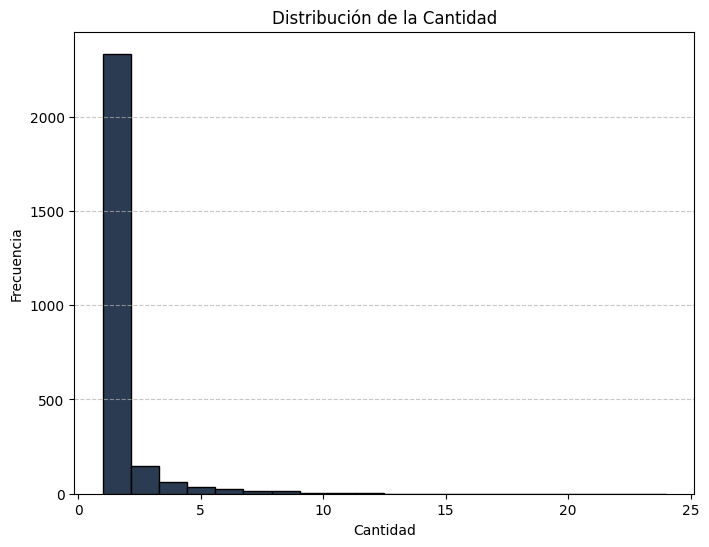

In [ ]:
plt.figure(figsize=(8, 6))
plt.hist(data['Cantidad'], bins=20, color=colores[0], edgecolor='k')
plt.xlabel('Cantidad')
plt.ylabel('Frecuencia')
plt.title('Distribución de la Cantidad')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

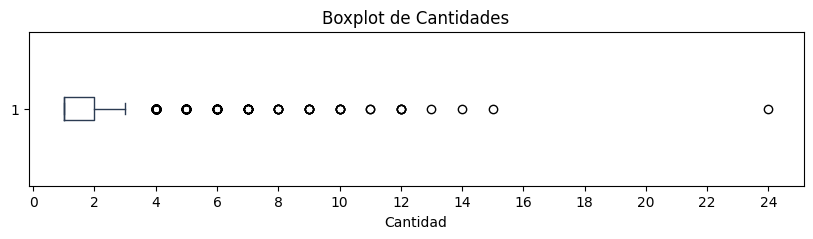

In [ ]:
# Color personalizado para el boxplot
color_box = colores[0]

plt.figure(figsize=(10, 2))
plt.boxplot(data['Cantidad'], vert=False, boxprops={'color': color_box}, capprops={'color': color_box}, whiskerprops={'color': color_box}, medianprops={'color': color_box})
plt.xlabel('Cantidad')
plt.xlabel('Cantidad')
plt.title('Boxplot de Cantidades')
plt.xticks(range(0, max(data['Cantidad'])+1, 2))
plt.show()

In [ ]:
def solo(fila):
    if fila == 1:
        return True
    else:
        return False

data['Solo'] = data['Cantidad'].apply(solo)

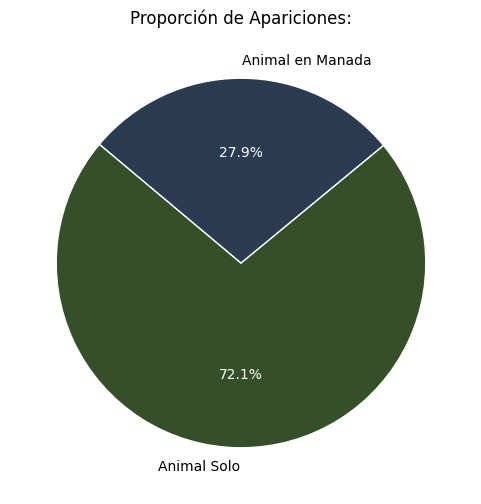

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    data['Solo'].value_counts(),
    labels=("Animal Solo",'Animal en Manada'),
    autopct='%1.1f%%',
    startangle=140,
    colors=(colores[1],colores[0]),
    wedgeprops={'edgecolor': 'white'}  
)

for text in autotexts:
    text.set_color('white')

plt.title('Proporción de Apariciones:')
plt.show()

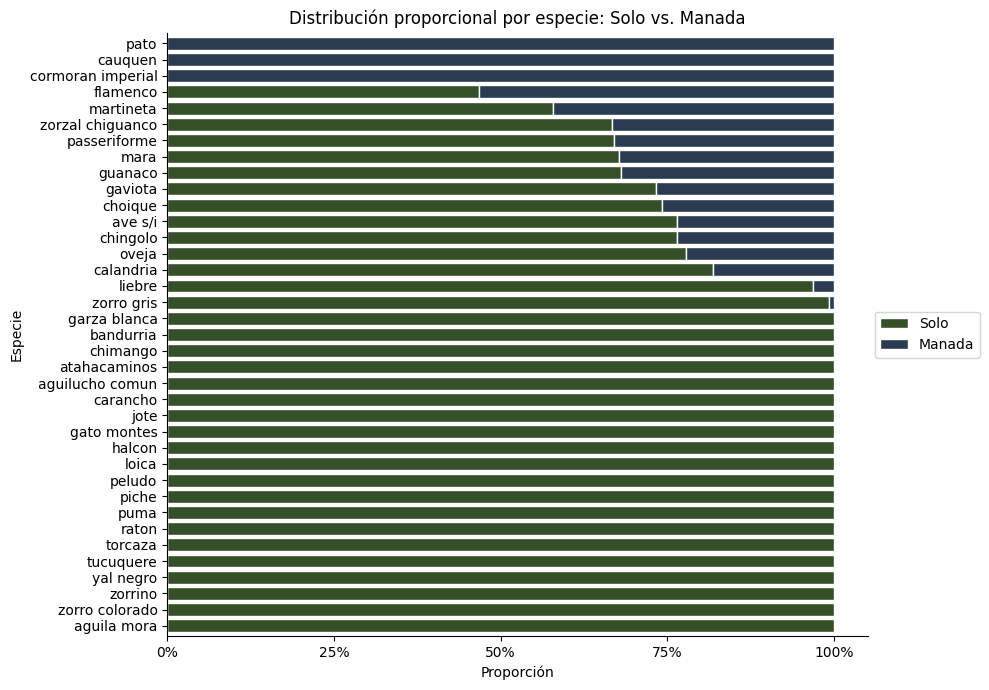

In [110]:
# Crear columna "Manada" como complemento de "Solo"
data['Manada'] = 1 - data['Solo']

grouped = data.drop(['Sitio', 'Año', 'Camara','Cantidad', 'Nombre', 'Fecha','Hora'], axis = 1)

# Agrupar por especie y sumar
grouped = grouped.groupby('Especie').sum()

# Convertir a proporciones
grouped['Solo'] = grouped['Solo'] / (grouped['Solo'] + grouped['Manada'])
grouped['Manada'] = 1 - grouped['Solo']

# Ordenar por Manada
grouped = grouped.sort_values(by='Manada', ascending=True)

# Gráfico de barras apiladas en proporciones (horizontal)
ax = grouped.plot(kind='barh', stacked=True, figsize=(10,7), color=[colores[1], colores[0]], width=0.8, edgecolor='white', linewidth=1)
plt.title('Distribución proporcional por especie: Solo vs. Manada')
plt.xlabel('Proporción')
plt.ylabel('Especie')
plt.xticks([0, 0.25, 0.5, 0.75, 1], ['0%', '25%', '50%', '75%', '100%'])  # Convertir a porcentajes
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Mover leyenda a la derecha del gráfico
ax.spines['top'].set_visible(False)     # Quitar borde superior
ax.spines['right'].set_visible(False)   # Quitar borde derecho
plt.tight_layout()  # Ajustar layout para que todo se vea correctamente
plt.show()

In [116]:
# Listas de categorías
aves = ('martineta', 'choique', 'passeriforme', 'tucuquere', 'gaviota', 'jote', 'chimango', 'ave s/i', 'flamenco', 'aguila mora', 'garza blanca', 'halcon', 'atahacaminos', 'bandurria', 'chingolo', 'loica', 'calandria', 'zorzal chiguanco', 'yal negro', 'torcaza', 'carancho', 'aguilucho comun', 'cormoran imperial', 'cauquen', 'pato')
roedor = ('raton', 'piche')
mam_herbivoro = ('guanaco', 'liebre', 'mara', 'oveja', 'piche')
mam_carnivoro = ('zorro gris', 'gato montes', 'peludo', 'zorrino', 'puma', 'zorro colorado', 'raton')

In [117]:
# Función para asignar categoría
def asignar_categoria(especie):
    if especie in aves:
        return 'Ave'
    elif especie in mam_herbivoro:
        return 'Mamifero Herbivoro'
    elif especie in mam_carnivoro:
        return 'Mamifero Carnivoro'
    else:
        return 'Otra'  # Puedes cambiar esto según tus necesidades

In [11]:
def guanacosolo(fila):
    if (fila['Cantidad'] == 1) and (fila['Especie']=='guanaco'):
        return True
    else:
        return False

data['GuanacoSolo'] = data.apply(guanacosolo, axis=1)

In [118]:
# Aplicar la función para crear una nueva columna 'Categoria'
data['Categoria'] = data['Especie'].apply(asignar_categoria)

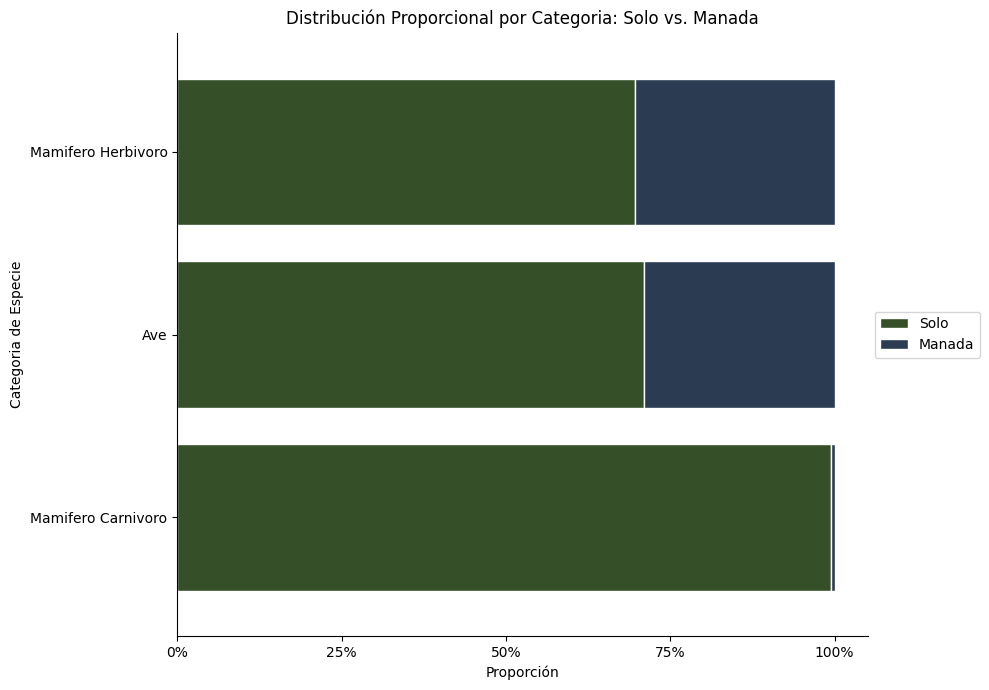

In [119]:
# Crear columna "Manada" como complemento de "Solo"
data['Manada'] = 1 - data['Solo']

grouped = data.drop(['Sitio', 'Año', 'Camara','Cantidad', 'Nombre', 'Fecha','Hora'], axis = 1)

# Agrupar por especie y sumar
grouped = grouped.groupby('Categoria').sum()

# Convertir a proporciones
grouped['Solo'] = grouped['Solo'] / (grouped['Solo'] + grouped['Manada'])
grouped['Manada'] = 1 - grouped['Solo']

# Ordenar por Manada
grouped = grouped.sort_values(by='Manada', ascending=True)

# Gráfico de barras apiladas en proporciones (horizontal)
ax = grouped.plot(kind='barh', stacked=True, figsize=(10,7), color=[colores[1], colores[0]], edgecolor='white', width=0.8)
plt.title('Distribución Proporcional por Categoria: Solo vs. Manada')
plt.xlabel('Proporción')
plt.ylabel('Categoria de Especie')
plt.xticks([0, 0.25, 0.5, 0.75, 1], ['0%', '25%', '50%', '75%', '100%'])  # Convertir a porcentajes
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Mover leyenda a la derecha del gráfico
ax.spines['top'].set_visible(False)     # Quitar borde superior
ax.spines['right'].set_visible(False)   # Quitar borde derecho
plt.tight_layout()  # Ajustar layout para que todo se vea correctamente
plt.show()

#### Fecha:

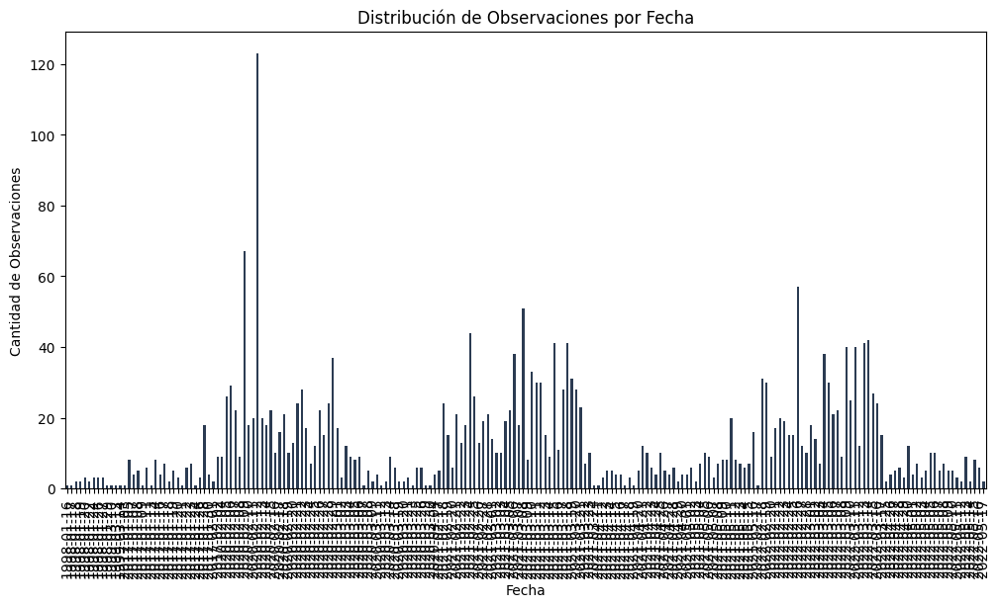

In [165]:
plt.figure(figsize=(12, 6))
data['Fecha'].value_counts().sort_index().plot(kind='bar', color=colores[0])
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Observaciones')
plt.title('Distribución de Observaciones por Fecha')
plt.xticks(rotation=90)
plt.show()

In [166]:
data['Fecha'] = pd.to_datetime(data['Fecha'])

# Obtiene la fecha mínima y máxima
fecha_minima = data['Fecha'].min()
fecha_maxima = data['Fecha'].max()

print('Fecha Mínima:', fecha_minima)
print('Fecha Máxima:', fecha_maxima)

Fecha Mínima: 1998-01-16 00:00:00
Fecha Máxima: 2022-05-17 00:00:00


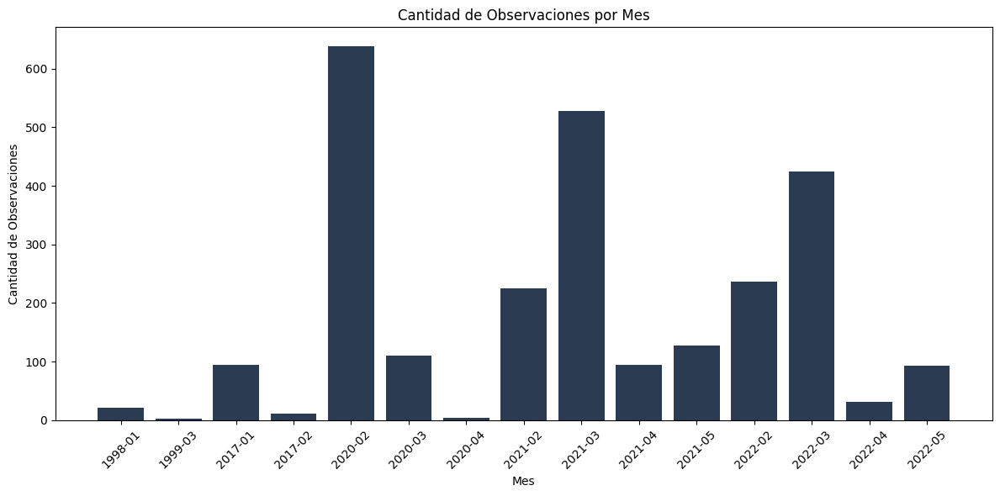

In [167]:
# Agrupar los datos por mes y contar las observaciones en cada mes
data['Año-Mes'] = data['Fecha'].dt.strftime('%Y-%m')
conteo_por_mes = data['Año-Mes'].value_counts().sort_index()

# Crear un gráfico de barras para mostrar el conteo por mes
plt.figure(figsize=(12, 6))  # Tamaño opcional del gráfico
plt.bar(conteo_por_mes.index, conteo_por_mes.values, color='#2B3B52')
plt.xlabel('Mes')
plt.ylabel('Cantidad de Observaciones')
plt.title('Cantidad de Observaciones por Mes')
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para una mejor visualización
plt.tight_layout()  # Ajustar el diseño del gráfico
plt.show()

#### Hora:

/var/folders/6c/17qbm4nd5318hd4bcrx68wjh0000gn/T/ipykernel_68133/1687423130.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data['Hora'] = pd.to_datetime(data['Hora'])


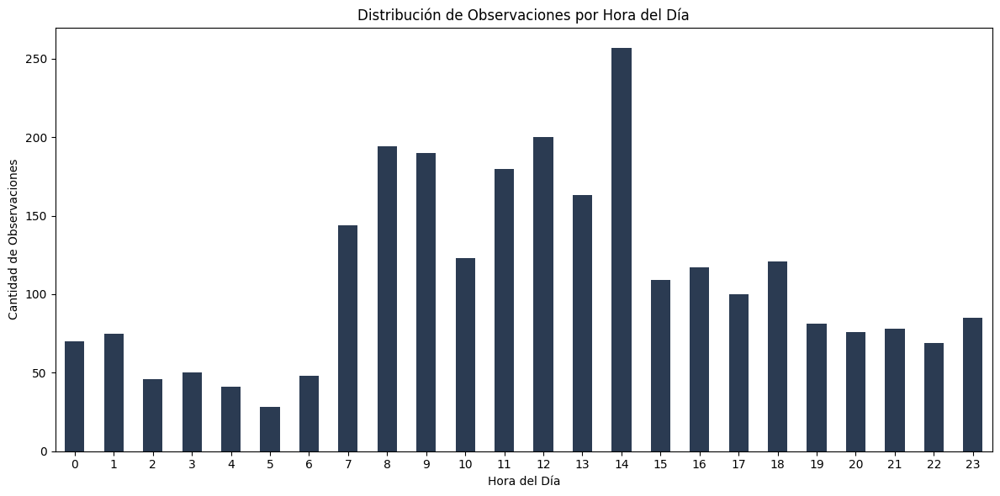

In [170]:
# Asegúrate de que la columna 'Hora' esté en formato datetime
data['Hora'] = pd.to_datetime(data['Hora'])

# Agrupa las observaciones por hora
observaciones_por_hora = data.groupby(data['Hora'].dt.hour)['Hora'].count()

# Crea un gráfico de barras para mostrar la cantidad de observaciones por hora
plt.figure(figsize=(12, 6))
observaciones_por_hora.plot(kind='bar', color=colores[0])
plt.xlabel('Hora del Día')
plt.ylabel('Cantidad de Observaciones')
plt.title('Distribución de Observaciones por Hora del Día')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

#### Calidad de las Imagenes

*Calidad de Imágenes:* Se analizará la calidad de las imágenes. Se mostrará la distribución de imágenes oscuras o imágenes con baja visibilidad. Esto ayudará a identificar problemas técnicos con las cámaras o condiciones ambientales adversas.

In [187]:
# Extraigo 16 imagenes random del dataset.
# minidf = random.sample(dfetiquetas['Ruta'].tolist(), 160)
minidf = df[df['Ruta'] != '']['Ruta']

In [188]:
# Lista para almacenar la calidad de las imágenes
calidad_imagenes = []

# Lista para almacenar los niveles de luminosidad
niveles_de_luminosidad = []

# Itera sobre los objetos y analiza la calidad de las imágenes
for obj in minidf:
    try:
        # Descarga la imagen desde S3
        image_obj = s3.get_object(Bucket=nombre_bucket_s3, Key=obj)
        image_data = image_obj['Body'].read()
        
        # Convierte los datos en una imagen PIL
        img = Image.open(io.BytesIO(image_data))

        # Calcula la luminancia promedio de la imagen
        luminancia_promedio = np.array(img).mean()
        
        # Define un umbral para determinar si la imagen es oscura
        umbral_oscuridad = 100  # Ajusta este valor según tus necesidades
        
        # Clasifica la imagen como oscura o no
        calidad = "Oscura" if luminancia_promedio < umbral_oscuridad else "Buena"
        
        calidad_imagenes.append(calidad)

        # Agrega el nivel de luminosidad a la lista
        niveles_de_luminosidad.append(luminancia_promedio)

    except Exception as e:
        pass


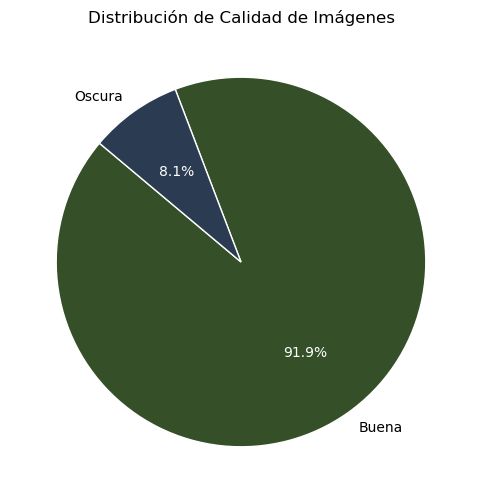

In [198]:
# Contar la cantidad de imágenes de cada calidad
conteo_calidades = Counter(calidad_imagenes)

# Extraer etiquetas y valores para el gráfico de barras
etiquetas = list(conteo_calidades.keys())
valores = list(conteo_calidades.values())

fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    valores,
    labels=etiquetas,
    autopct='%1.1f%%',
    startangle=140,
    colors=(colores[1],colores[0]),
    wedgeprops={'edgecolor': 'white'}  
)

for text in autotexts:
    text.set_color('white')

# Generar un gráfico de torta para mostrar la distribución de calidad
plt.title('Distribución de Calidad de Imágenes')
plt.show()

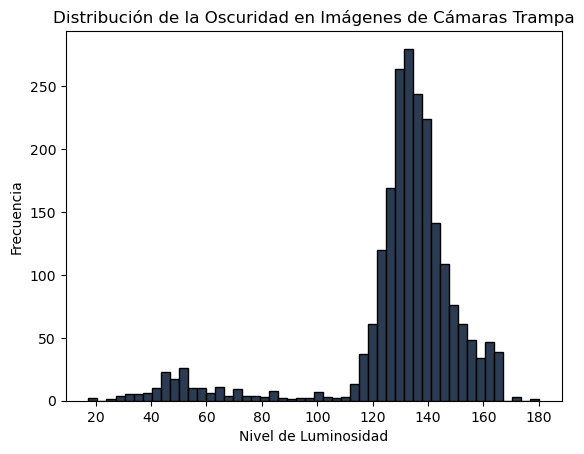

In [190]:
# Genera un histograma de los niveles de luminosidad
plt.hist(niveles_de_luminosidad, bins=50, edgecolor='k', color=colores[0])
plt.xlabel('Nivel de Luminosidad')
plt.ylabel('Frecuencia')
plt.title('Distribución de la Oscuridad en Imágenes de Cámaras Trampa')
plt.show()

Las imagenes totales siguen la misma distribucion de luminocidad?

In [163]:
paths_filtrados = []

for path in objetos_s3:
    # Buscar "Muestreo ct Iberica" o "Muestreo ct sauce" en el path
    if "Muestreo ct Iberica" in path or "Muestreo ct sauce" in path:
        # Buscar el año en el path
        year_start = path.find("20")
        if year_start != -1:
            # Intentar extraer el año en formato "20XX"
            try:
                año = int(path[year_start:year_start+4])
                if año == 2023:
                    paths_filtrados.append(path)
            except ValueError:
                # Si no se puede convertir a int, intentar encontrar un año en el formato "CT S 2020"
                match = re.search(r'\b(20\d{2})\b', path)
                if match:
                    año = int(match.group(0))
                    if año == 2023:
                        paths_filtrados.append(path)

In [164]:
# Extraigo 10000 imagenes random del dataset.
minidf = random.sample(paths_filtrados, 10000)

In [170]:
# Lista para almacenar la calidad de las imágenes
calidad_imagenes = []

# Lista para almacenar los niveles de luminosidad
niveles_de_luminosidad = []

# Itera sobre los objetos y analiza la calidad de las imágenes
for obj in minidf:
    try:
        # Descarga la imagen desde S3
        image_obj = s3.get_object(Bucket=nombre_bucket_s3, Key=obj)
        image_data = image_obj['Body'].read()
        
        # Convierte los datos en una imagen PIL
        img = Image.open(io.BytesIO(image_data))

        # Calcula la luminancia promedio de la imagen
        luminancia_promedio = np.array(img).mean()
        
        # Define un umbral para determinar si la imagen es oscura
        umbral_oscuridad = 100  # Ajusta este valor según tus necesidades
        
        # Clasifica la imagen como oscura o no
        calidad = "Oscura" if luminancia_promedio < umbral_oscuridad else "Buena"
        
        calidad_imagenes.append(calidad)

        # Agrega el nivel de luminosidad a la lista
        niveles_de_luminosidad.append(luminancia_promedio)
        
    except Exception as e:
        pass


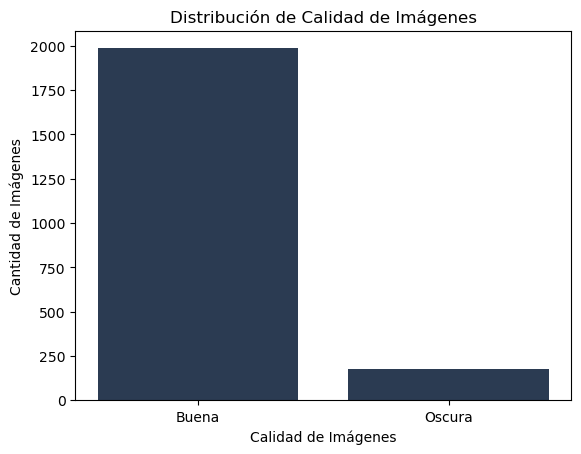

In [195]:
# Contar la cantidad de imágenes de cada calidad
conteo_calidades = Counter(calidad_imagenes)

# Extraer etiquetas y valores para el gráfico de barras
etiquetas = list(conteo_calidades.keys())
valores = list(conteo_calidades.values())

# Generar un gráfico de barras para mostrar la distribución de calidad
plt.bar(etiquetas, valores, color=colores[0])
plt.xlabel('Calidad de Imágenes')
plt.ylabel('Cantidad de Imágenes')
plt.title('Distribución de Calidad de Imágenes')
plt.show()

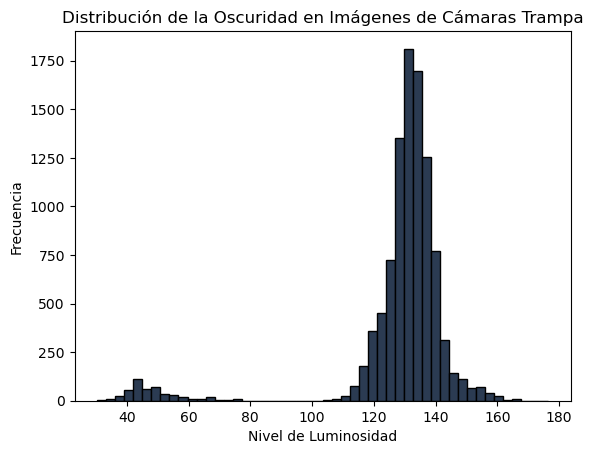

In [174]:
# Genera un histograma de los niveles de luminosidad
plt.hist(niveles_de_luminosidad, bins=50, edgecolor='k', color=colores[0])
plt.xlabel('Nivel de Luminosidad')
plt.ylabel('Frecuencia')
plt.title('Distribución de la Oscuridad en Imágenes de Cámaras Trampa')
plt.show()

### Concurrencias

In [32]:
da = pd.read_csv('ArchivosUtiles/detecciones_S4.csv', sep=';')

In [15]:
data['Ruta'] = "Muestreo ct sauce/CT S 2023/S4/" + data['file']

In [16]:
data['Fecha'], data['Hora'] = zip(*data['Ruta'].apply(extraerFechaHora))

In [18]:
data['Fecha'] = pd.to_datetime(data['Fecha'], format="%Y:%m:%d")
data['Hora'] = pd.to_datetime(data['Hora'], format="%H:%M:%S").dt.strftime("%H:%M:%S")

In [17]:
data = data[data['confidence']>=0.8]

In [20]:
# sacar files duplicados
data = data.drop_duplicates(subset=['file'], keep='first')

In [37]:
data.to_csv('S4.csv', index=False)

In [38]:
# agrupar por imagenes consecutivas, si la diferencia entre la fecha de la imagen y la fecha de la imagen anterior es menor a 1 minuto, se considera que es la misma deteccion
data['FechaHora'] = pd.to_datetime(data['Fecha'].astype(str) + ' ' + data['Hora'].astype(str))

# Set a threshold for time difference (1 minute)
time_threshold = pd.Timedelta(minutes=2)

# Group by consecutive photos with a time difference less than or equal to the threshold
data['Rafaga'] = (data['FechaHora'].diff() > time_threshold).cumsum()

# Create the new DataFrame with group and amount columns
result_df = data.groupby('Rafaga').size().reset_index(name='amount')


/var/folders/6c/17qbm4nd5318hd4bcrx68wjh0000gn/T/ipykernel_2665/3008168049.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FechaHora'] = pd.to_datetime(data['Fecha'].astype(str) + ' ' + data['Hora'].astype(str))
/var/folders/6c/17qbm4nd5318hd4bcrx68wjh0000gn/T/ipykernel_2665/3008168049.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Rafaga'] = (data['FechaHora'].diff() > time_threshold).cumsum()


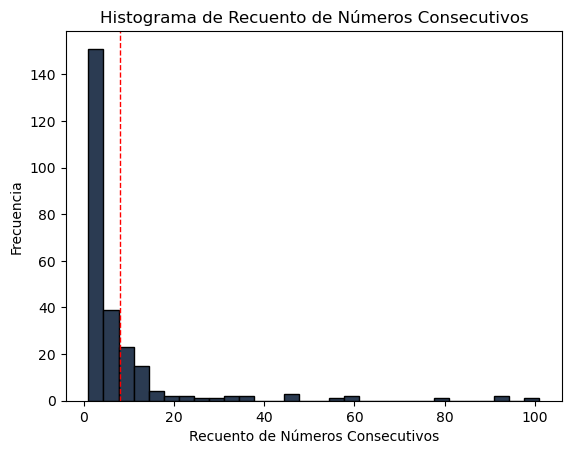

In [40]:
# Creating the histogram
plt.hist(result_df['amount'], bins=30, color=colores[0], edgecolor='black')

# Adding a dashed line at the mean
plt.axvline(result_df['amount'].mean(), color='red', linestyle='dashed', linewidth=1)

# Adding titles and labels
plt.title('Histograma de Recuento de Números Consecutivos')
plt.xlabel('Recuento de Números Consecutivos')
plt.ylabel('Frecuencia')

# Showing the plot
plt.show()

#### Visualizacion de la Base

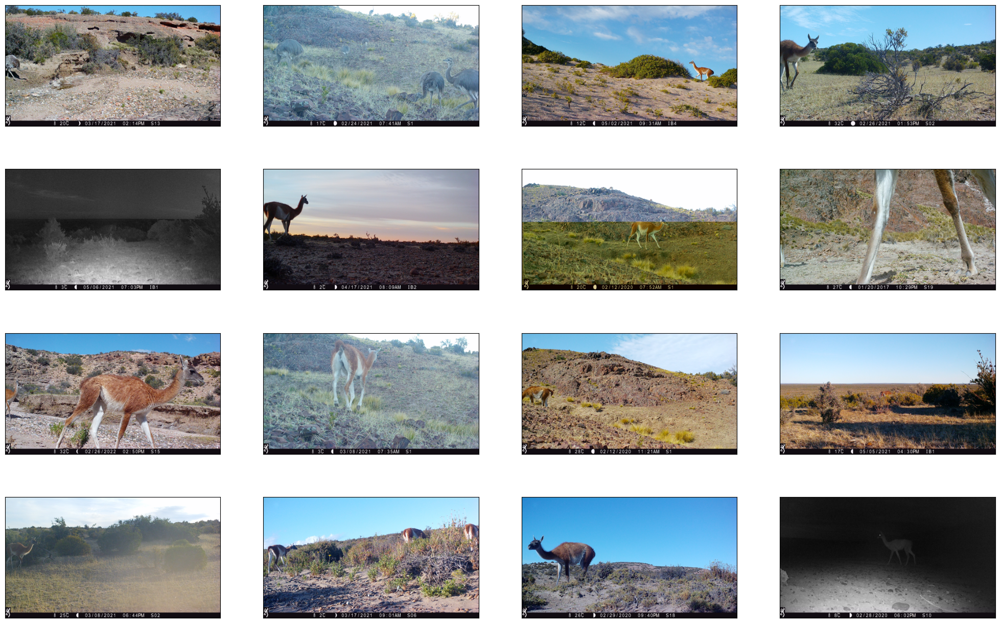

In [72]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)

Se encontro esta imagen que esta etiquetada como Passseriforme y cantidad 1.

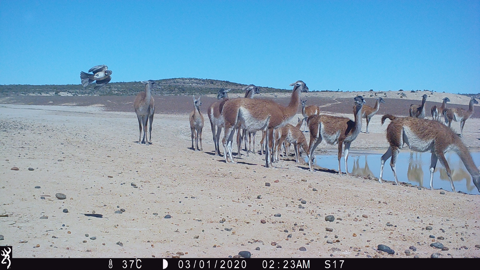

In [547]:
ruta_imagen_s3 = "Muestreo ct sauce/CT S 2020/S17/z-S17 (2792).JPG"

# Descarga la imagen desde S3
response = s3.get_object(Bucket=nombre_bucket_s3, Key=ruta_imagen_s3)

# Lee los datos de la imagen
datos_imagen = response['Body'].read()

# Abre la imagen utilizando Pillow
imagen = Image.open(BytesIO(datos_imagen))

imagen = imagen.resize((480,270))

# Muestra la imagen en el Jupyter Notebook
display(imagen)

Esta, pero ademas esta acompañado de una manada de guanacos. Esto puede causar problemas para el modelo predictivo.

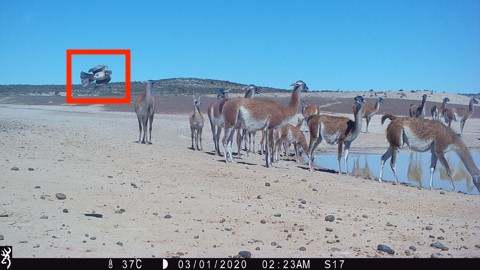

In [970]:
# Passeriforme: 
from IPython.display import Image
image_path = 'passeriformes3.png'
Image(filename=image_path)

##### Passeriforme:

In [967]:
# Extraigo 16 imagenes random etiquetadas como Passeriforme
minidf = random.sample(dfetiquetas.loc[dfetiquetas['Especie']=='passeriforme','Ruta'].tolist(), 16)

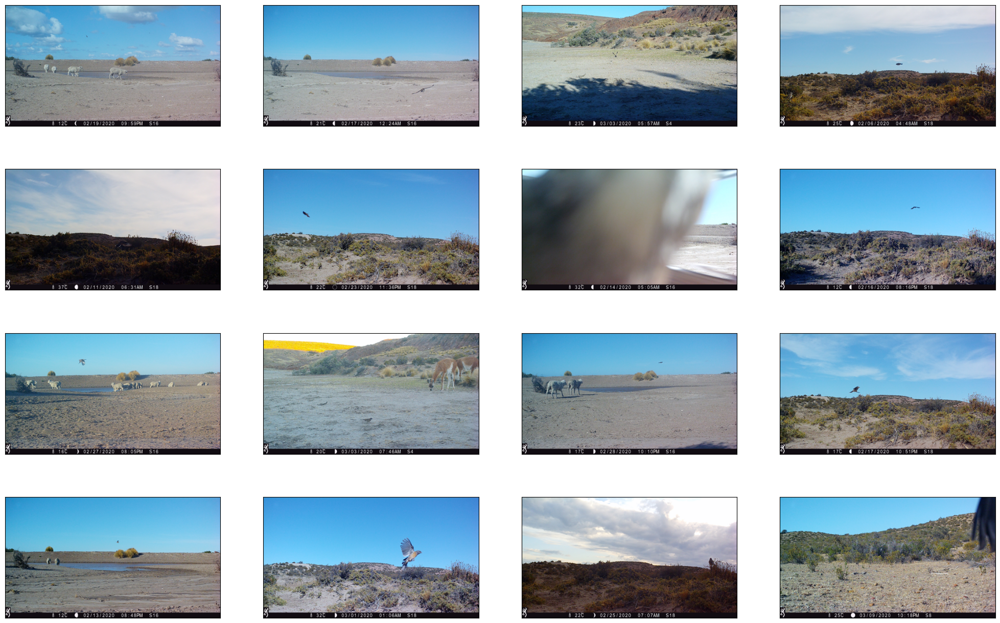

In [968]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)

##### Guanaco:

In [960]:
# Extraigo 16 imagenes random etiquetadas como Guanaco
minidf = random.sample(dfetiquetas.loc[dfetiquetas['Especie']=='Guanaco','Ruta'].tolist(), 16)

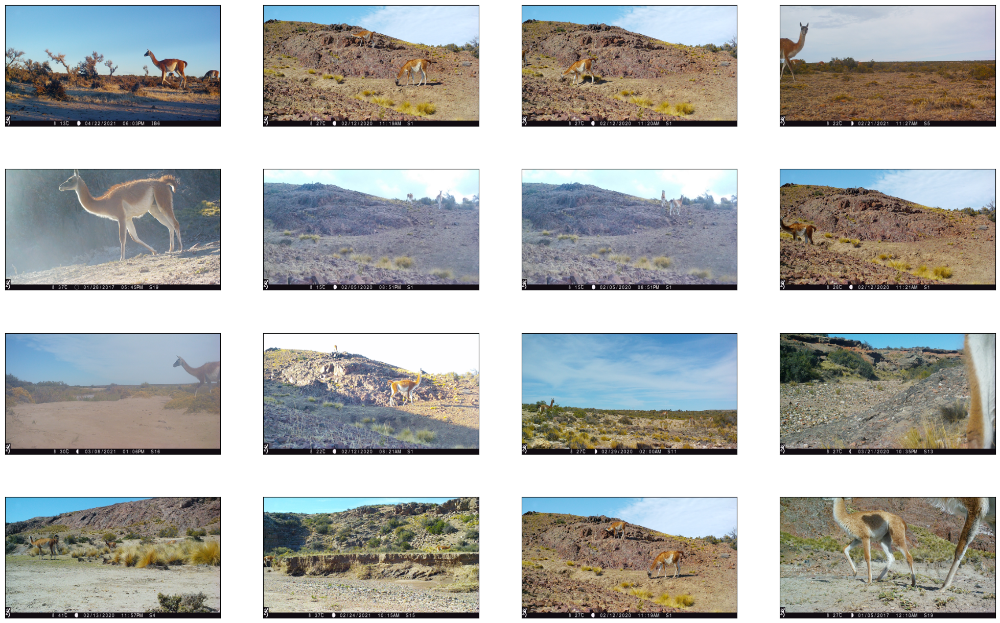

In [961]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)